In [1]:
# Import libraries
import os  # For interacting with the file system
#import shutil  # For managing files and directories in a cross-platform manner
import keras  # For building deep learning models
import numpy as np  # For numerical operations on arrays
#from glob import glob  # For finding file paths
#from tqdm import tqdm  # For progress bars


In [2]:
# Data preprocessing
from keras.preprocessing.image import ImageDataGenerator  # For image data augmentation


ImportError: cannot import name 'ImageDataGenerator' from 'keras.preprocessing.image' (C:\Users\HP\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\api\preprocessing\image\__init__.py)

In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [9]:
pip install plotly


   ---------------------------------------- 0.0/14.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/14.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/14.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/14.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/14.8 MB ? eta -:--:--
    --------------------------------------- 0.3/14.8 MB ? eta -:--:--
    --------------------------------------- 0.3/14.8 MB ? eta -:--:--
    --------------------------------------- 0.3/14.8 MB ? eta -:--:--
   -- ------------------------------------- 0.8/14.8 MB 632.4 kB/s eta 0:00:23
   -- ------------------------------------- 1.0/14.8 MB 786.4 kB/s eta 0:00:18
   --- ------------------------------------ 1.3/14.8 MB 882.6 kB/s eta 0:00:16
   ---- ----------------------------------- 1.6/14.8 MB 963.8 kB/s eta 0:00:14
   ----- ---------------------------------- 2.1/14.8 MB 1.1 MB/s eta 0:00:12
   ------ --------------------------------- 2.4

In [10]:
# Data visualization
import seaborn as sns  # For statistical visualizations
import plotly.graph_objs as go  # For interactive visualizations
import matplotlib.pyplot as plt  # For creating static plots


In [4]:
# Model architecture
from keras import Sequential  # For building sequential models
from keras.models import load_model  # For loading pre-trained models
from keras.layers import Dense, GlobalAvgPool2D as GAP, Dropout  # For defining model layers


In [5]:
# Training callbacks
from keras.callbacks import ModelCheckpoint, EarlyStopping  # For training callbacks


In [6]:
# Pre-trained models
from tensorflow.keras.applications import InceptionV3, Xception, ResNet152V2  # For using pre-trained models

Exploring the dataset

In [7]:
# Set the path to the dataset
data_path = r'E:\project_2\working\Animal Classification\dataset'

# Get a list of class names from the data path
class_names = sorted(os.listdir(data_path))

# Count the number of classes
num_classes = len(class_names)

# Print the class names and the total number of classes
print("Class Names: \n", class_names)
print("Number of Classes:", num_classes)

Class Names: 
 ['Bear', 'Bird', 'Cat', 'Cow', 'Deer', 'Dog', 'Dolphin', 'Elephant', 'Giraffe', 'Horse', 'Kangaroo', 'Lion', 'Panda', 'Tiger', 'Zebra']
Number of Classes: 15


3. Examining Class Distribution in the Animal-10 Dataset

In [11]:
# Get the number of samples in each class
class_sizes = []
for name in class_names:
    class_size = len(os.listdir(data_path + "/" + name))
    class_sizes.append(class_size)
    
# Print the class distribution
print("Class Distribution:\n", class_sizes)

Class Distribution:
 [125, 137, 123, 131, 127, 122, 129, 133, 129, 130, 126, 131, 135, 129, 137]


In [12]:
# to convert lists to dictionary **************
class_name_size = dict(zip(class_names, class_sizes))

In [13]:
class_name_size

{'Bear': 125,
 'Bird': 137,
 'Cat': 123,
 'Cow': 131,
 'Deer': 127,
 'Dog': 122,
 'Dolphin': 129,
 'Elephant': 133,
 'Giraffe': 129,
 'Horse': 130,
 'Kangaroo': 126,
 'Lion': 131,
 'Panda': 135,
 'Tiger': 129,
 'Zebra': 137}

4. Visualizing Class Distribution in the Animal-10 Dataset using a Pie Chart and Bar Graph

In [14]:
# Define the data
data = go.Pie(labels=class_names, values=class_sizes)

# Define the layout
layout = go.Layout(title={"text": "Class Distribution", "x": 0.5})

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()

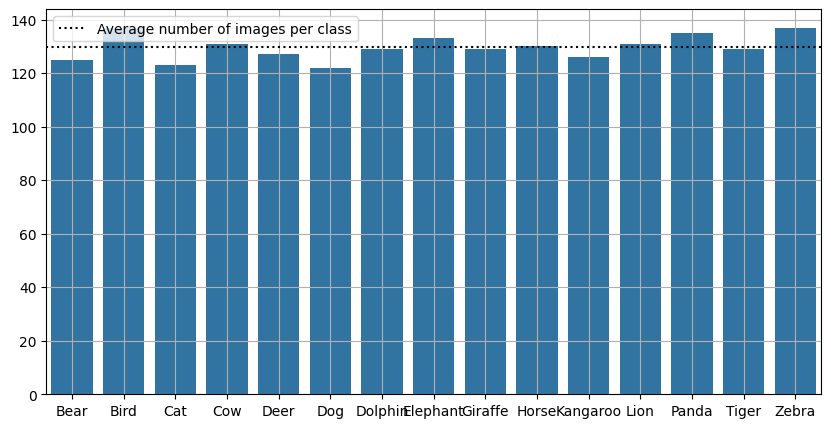

In [15]:
# Plot a bar graph of the number of images in each class

# Set the size of the figure
plt.figure(figsize=(10,5))

# Plot a bar chart using the class names as the x-axis and class sizes as the y-axis
sns.barplot(x=class_names, y=class_sizes)

# Add a grid to the plot
plt.grid()

# Add a horizontal line to show the mean number of images across all classes
plt.axhline(np.mean(class_sizes), color='black', linestyle=':', label="Average number of images per class")

# Add a legend to the plot
plt.legend()

# Show the plot
plt.show()


In [16]:
np.min(class_sizes)

np.int64(122)

In [21]:
import shutil

# Set the path to the directory where the sampled data will be saved
sampled_data_path = r'E:\project_2\working\Animal Classification\sampled_data'

# Create the sampled data directory if it doesn't exist
if not os.path.exists(sampled_data_path):
    os.mkdir(sampled_data_path)

# Set the percentage of each class to sample
sample_percent = 0.1

# Define a dictionary that maps the original class names to their English names
class_names_dict = {
    'cane': 'dog',
    'cavallo': 'horse',
    'elefante': 'elephant',
    'farfalla': 'butterfly',
    'gallina': 'chicken',
    'gatto': 'cat',
    'mucca': 'cow',
    'pecora': 'sheep',
    'ragno': 'spider',
    'scoiattolo': 'squirrel'
}

# Loop through each class directory and copy 2000 images or less to the sampled data directory
for class_name in os.listdir(data_path):
    # Get the path to the original class directory
    class_path = os.path.join(data_path, class_name)
    # Get the English name of the class
    #class_name_en = class_names_dict[class_name]
    class_name_en = class_names_dict.get(class_name, class_name)
     # Get the path to the sampled class directory
    sampled_class_path = os.path.join(sampled_data_path, class_name_en)
    # Create the sampled class directory and fill it up only if it doesn't exist ********
    if not os.path.exists(sampled_class_path):
        os.mkdir(sampled_class_path)
        # Get a list of all the image files in the class directory
        image_files = os.listdir(class_path)
        # Calculate the number of images to sample **************
        image_class_size = class_name_size[class_name]
        if image_class_size > 2000:
            num_images = 2000
        else:
            num_images = int(image_class_size)
        # Sample the images
        sampled_images = np.random.choice(image_files, size=num_images, replace=False)
        # Copy the sampled images to the sampled class directory
        for image_name in sampled_images:
            src_path = os.path.join(class_path, image_name)
            dst_path = os.path.join(sampled_class_path, image_name)
            shutil.copyfile(src_path, dst_path)

In [22]:
# Get a list of class names from the sampled data directory
class_names = sorted(os.listdir(sampled_data_path))

# Get the number of samples in each class
class_sizes = []
for name in class_names:
    # Get the number of samples in the class directory
    class_size = len(os.listdir(os.path.join(sampled_data_path, name)))
    class_sizes.append(class_size)
    
# Print the class distribution
print("Class Distribution:\n", class_sizes)

Class Distribution:
 [0, 137, 123, 131, 127, 122, 129, 133, 129, 130, 126, 131, 135, 129, 137]


In [23]:
# Define the data
data = go.Pie(labels=class_names, values=class_sizes)

# Define the layout
layout = go.Layout(title={"text": "Class Distribution", "x": 0.5})

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()

6. Data Preparation and Augmentation

In [24]:
# Initialize Generator with the specified image transformations and preprocessing
# rescale: normalizes pixel values from 0-255 to 0-1
# horizontal_flip: randomly flips images horizontally
# vertical_flip: randomly flips images vertically
# rotation_range: randomly rotates images by a given range in degrees
# validation_split: splits the data into training and validation sets, with 20% of the data used for validation
data_generator = ImageDataGenerator(
    rescale=1./255, 
    horizontal_flip=True, 
    vertical_flip=True, 
    rotation_range=20, 
    validation_split=0.2)

# Load training data from the specified directory and apply the generator
# target_size: resizes the images to a specified size
# class_mode: specifies the type of label encoding, binary for 2 classes
# batch_size: specifies the number of samples per batch
# shuffle: shuffles the data after each epoch
# subset: specifies the subset of data to load, in this case, the training set
train_data = data_generator.flow_from_directory(
    sampled_data_path, 
    target_size=(256,256), 
    class_mode='binary', 
    batch_size=32, 
    shuffle=True, 
    subset='training')

# Load validation data from the specified directory and apply the generator
# subset: specifies the subset of data to load, in this case, the validation set
valid_data = data_generator.flow_from_directory(
    sampled_data_path, 
    target_size=(256,256), 
    class_mode='binary', 
    batch_size=32, 
    shuffle=True, 
    subset='validation')

Found 1461 images belonging to 15 classes.
Found 358 images belonging to 15 classes.


7. Data Visualization

In [25]:
def show_image(image, image_title=None):
    '''
    This function takes in an image and an optional title and plots the image.
    '''
    # Display the image
    plt.imshow(image)
    
    # Set the title of the plot if provided
    plt.title(image_title)
    
    # Turn off the axes in the plot
    plt.axis('off')

In [26]:
def get_random_data(data_tuple):
    """
    Function to get a random data point from a given dataset.

    Args:
    data_tuple (tuple): A tuple containing the dataset images and labels as numpy arrays.

    Returns:
    A random image and its corresponding label as numpy arrays.
    """
    images, labels = data_tuple
    # get a random index for an image in the dataset
    idx = np.random.randint(len(images))

    # select the image and its corresponding label using the random index
    image, label = images[idx], labels[idx]

    # return the selected image and label
    return image, label

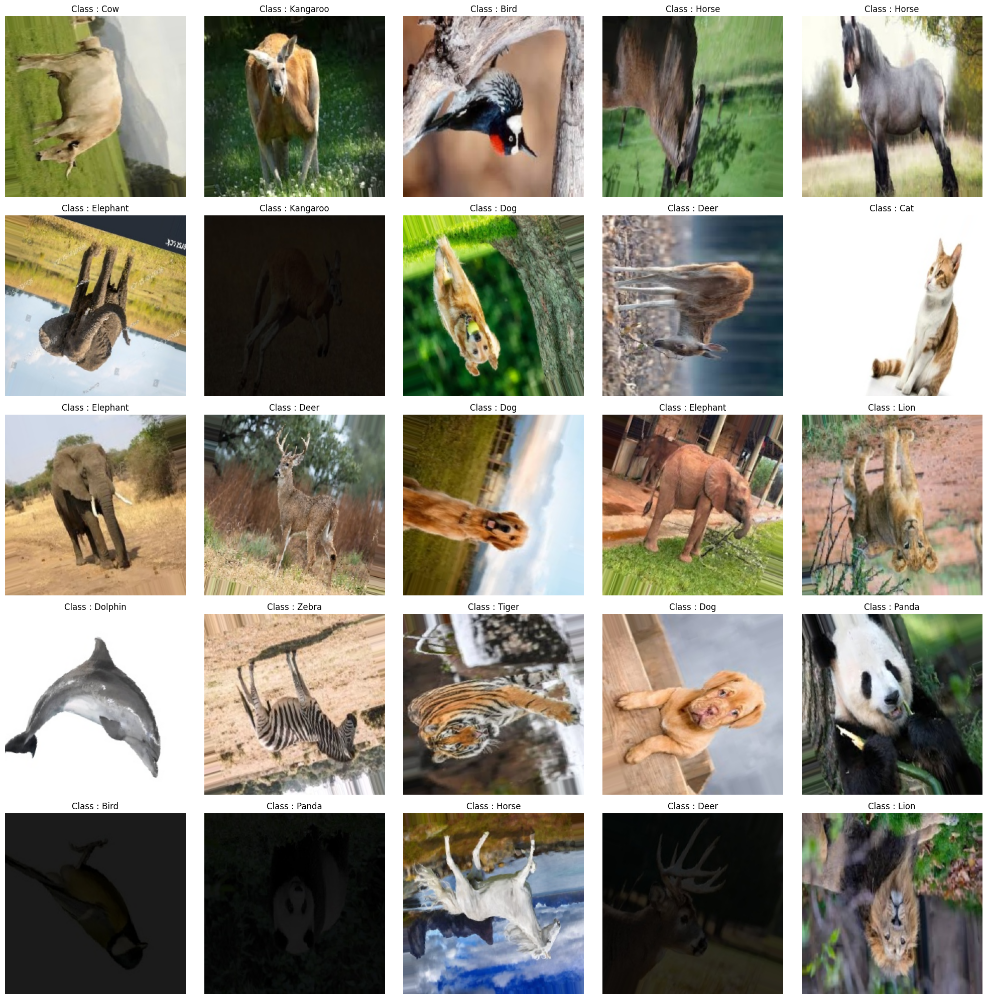

In [27]:
# Set the figure size for the plot
plt.figure(figsize=(20,20))

# Initialize a counter for the subplots
counter=1

# Loop over the train dataset
for images, labels in iter(train_data):
    
    # Get a random image and label
    image, label = get_random_data([images, labels])
    
    # Plot the image with its class name as the title
    plt.subplot(5,5,counter)
    show_image(image, image_title=f"Class : {class_names[int(label)]}")
    
    # Increment the counter
    counter+=1
    
    # End the loop when 25 images have been plotted
    if counter>=26: break

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

8. Model Training

In [28]:
# Specify the name of the model as "ResNet152V2".
name = "ResNet152V2"

# Load the pre-trained ResNet152V2 model, freeze its weights and exclude its final classification layer.
base_model = ResNet152V2(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False

# Create a sequential model with the ResNet152V2 base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
resnet152V2 = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
resnet152V2.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

# Train the model using the training and validation datasets, using 50 epochs and the previously defined callbacks.
resnet152V2.fit(
    train_data, validation_data=valid_data,
    epochs=50, callbacks=cbs
)

234545216/234545216 ━━━━━━━━━━━━━━━━━━━━ 31s 0us/step 


C:\Users\HP\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



Epoch 1/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.6010 - loss: 1.4245  

46/46 ━━━━━━━━━━━━━━━━━━━━ 661s 14s/step - accuracy: 0.6043 - loss: 1.4119 - val_accuracy: 0.8045 - val_loss: 0.5697
Epoch 2/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.9279 - loss: 0.2297  

KeyboardInterrupt: 

In [30]:
# Specify the name of the model as "Inception".
name = "Inception"

# Load the pre-trained InceptionV3 model, freeze its weights and exclude its final classification layer.
base_model = InceptionV3(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False

# Create a sequential model with the InceptionV3 base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
inception = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
inception.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]
# Train the model using the training and validation datasets, using 50 epochs and the previously defined callbacks.
inception.fit(
    train_data, validation_data=valid_data,
    epochs=50, callbacks=cbs
)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 12s 0us/step
Epoch 1/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4557 - loss: 1.8925  

46/46 ━━━━━━━━━━━━━━━━━━━━ 185s 4s/step - accuracy: 0.4597 - loss: 1.8783 - val_accuracy: 0.7877 - val_loss: 0.6578
Epoch 2/50
 1/46 ━━━━━━━━━━━━━━━━━━━━ 2:44 4s/step - accuracy: 0.8438 - loss: 0.4319

KeyboardInterrupt: 

In [31]:
# Specify the name of the model as "Xception".
name = "Xception"

# Load the pre-trained Xception model, freeze its weights and exclude its final classification layer.
base_model = Xception(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False 

# Create a sequential model with the Xception base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
xception = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
xception.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

# Train the model using the training and validation datasets, using 50 epochs and the previously defined callbacks.
xception.fit(
    train_data, validation_data=valid_data,
    epochs=50, callbacks=cbs
)

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 10s 0us/step
Epoch 1/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.5270 - loss: 1.5827  

46/46 ━━━━━━━━━━━━━━━━━━━━ 286s 6s/step - accuracy: 0.5306 - loss: 1.5715 - val_accuracy: 0.7989 - val_loss: 0.6314
Epoch 2/50


KeyboardInterrupt: 

9. Loading a Pre-trained ResNet152V2 Model and Printing its Summary.

In [33]:
from tensorflow.keras.applications import ResNet152V2

# Load the pre-trained ResNet152V2 model (without top layer if you want to fine-tune)
model = ResNet152V2(weights='imagenet', include_top=True)  # Use include_top=False if you don't want classification head

# Save the model to an h5 file
model.save('ResNet152V2.h5')


242745792/242745792 ━━━━━━━━━━━━━━━━━━━━ 30s 0us/step


In [34]:
# set the file path to the pre-trained model

from tensorflow.keras.models import load_model
#model = load_model('ResNet152V2.h5')

model_file_path = r'ResNet152V2.h5' 

# load the pre-trained model
loaded_model = load_model(model_file_path)

# print a summary of the model's architecture
loaded_model.summary()

Model: "resnet152v2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)    │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_pad (ZeroPadding2D)     │ (None, 230, 230, 3)       │               0 │ input_layer_6[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_conv (Conv2D)           │ (None, 112, 112, 64)      │           9,472 │ conv1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pad (ZeroPadding2D)     │ (None, 114, 114, 64)      │               0 │ conv1_conv[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pool (MaxPooling2D)     │ (None, 56, 56, 64)        │               0 │ pool1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_bn        │ (None, 56, 56, 64)        │             256 │ pool1_pool[0][0]           │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_relu      │ (None, 56, 56, 64)        │               0 │ conv2_block1_preact_bn[0]… │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_conv (Conv2D)  │ (None, 56, 56, 64)        │           4,096 │ conv2_block1_preact_relu[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_bn             │ (None, 56, 56, 64)        │             256 │ conv2_block1_1_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_relu           │ (None, 56, 56, 64)        │               0 │ conv2_block1_1_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_pad            │ (None, 58, 58, 64)        │               0 │ conv2_block1_1_relu[0][0]  │
│ (ZeroPadding2D)               │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_conv (Conv2D)  │ (None, 56, 56, 64)        │          36,864 │ conv2_block1_2_pad[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_bn             │ (None, 56, 56, 64)        │             256 │ conv2_block1_2_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_relu           │ (None, 56, 56, 64)        │               0 │ conv2_block1_2_bn[0][0]    │
│ (Activation)                  │                           │               

 Total params: 60,380,648 (230.33 MB)

 Trainable params: 60,236,904 (229.79 MB)

 Non-trainable params: 143,744 (561.50 KB)

10. Evaluation of Pre-trained ResNet152V2 Model on Validation Dataset

In [36]:
from tensorflow.keras.models import load_model

# Load the model
loaded_model = load_model(model_file_path)

# Compile the model (define optimizer, loss function, metrics)
loaded_model.compile(
    optimizer='adam',  # or any optimizer you used during training
    loss='categorical_crossentropy',  # or the appropriate loss for your task
    metrics=['accuracy']  # or any metrics you want to evaluate
)

# Now evaluate on validation data
loaded_model.evaluate(valid_data)


ValueError: Input 0 of layer "resnet152v2" is incompatible with the layer: expected shape=(None, 224, 224, 3), found shape=(None, 256, 256, 3)

In [37]:
#This line of code evaluates the performance of the pre-trained model on the validation dataset.
loaded_model.evaluate(valid_data)

ValueError: Input 0 of layer "resnet152v2" is incompatible with the layer: expected shape=(None, 224, 224, 3), found shape=(None, 256, 256, 3)

In [38]:
plt.figure(figsize=(20,20))
i=1
for images, labels in iter(valid_data):
    
    # Get Random Image and label
    image, label = get_random_data([images, labels])
    pred_label = class_names[np.argmax(loaded_model.predict(image[np.newaxis,...]))]
    
    # Plot it
    plt.subplot(5,5,i)
    show_image(image, image_title=f"Class : {class_names[int(label)]}, Pred : {pred_label}")
    
    # Make sure to end the Loop
    i+=1
    if i>=26: break
        

plt.tight_layout()
plt.show()

ValueError: Input 0 of layer "resnet152v2" is incompatible with the layer: expected shape=(None, 224, 224, 3), found shape=(1, 256, 256, 3)

<Figure size 2000x2000 with 0 Axes>